# Yolov7 AnchorFree(u6) 版本的可视化分析和各层张量提取

+ 开始前，请将原仓库的u6分支克隆到目录下
```shell
git clone --recursive https://github.com/WongKinYiu/yolov7.git -b u6 --depth 1
```

+ 然后将修改好的common.py替换源代码
他们之间的区别是在前向传播时，各个Module在return前剥离梯度流并拷贝一份(detach)，保存到self.features内。这样可以直接访问模型运行上一张图时各个模块的features特征张量。
替换可以用如下脚本（如果你是linux请使用`mv`， Windows用户可以直接复制粘贴或者替换`mv`为`move`）
```shell
# On Linux
mv ./common.py ./yolov7/models/common.py

# On Windows
move ./common.py ./yolov7/models/common.py
```

+ 最后下载需要的 [权重文件](https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7-u6.pt) 到目录下
```shell
wget https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7-u6.pt
```


In [1]:
import os
import sys
import random

osp = os.path
sys.path.append("./yolov7")

import numpy as np
import matplotlib.pyplot as plt
import albumentations as A
import seaborn as sns
import cv2
from plot_lib import *
import torch
from torchvision import transforms
from tqdm import tqdm

from yolov7.models.yolo import Model
from yolov7.models.common import DetectMultiBackend
from yolov7.utils.general import non_max_suppression, scale_boxes, xywh2xyxy, xyxy2xywh, intersect_dicts
from yolov7.utils.augmentations import letterbox
from yolov7.utils.tal.anchor_generator import dist2bbox, make_anchors

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
torch.set_grad_enabled(False)
device = torch.device("cuda:0")

names = ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light',
         'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
         'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee',
         'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard',
         'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
         'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch',
         'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
         'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear',
         'hair drier', 'toothbrush']

ckpt = torch.load("yolov7-u6.pt", map_location='cpu')
model = Model("./yolov7/cfg/yolov7.yaml", ch=3).to(device)
csd = ckpt['model'].float().state_dict()
csd = intersect_dicts(csd, model.state_dict())
model.load_state_dict(csd, strict=False)
model.names = names
_ = model.eval()

color = [tuple(random.randint(0, 255) for _ in range(3)) for __ in model.names]


                 from  n    params  module                                  arguments                     
  0                -1  1       928  models.common.Conv                      [3, 32, 3, 1]                 
  1                -1  1     18560  models.common.Conv                      [32, 64, 3, 2]                
  2                -1  1     36992  models.common.Conv                      [64, 64, 3, 1]                
  3                -1  1     73984  models.common.Conv                      [64, 128, 3, 2]               
  4                -1  1      8320  models.common.Conv                      [128, 64, 1, 1]               
  5                -2  1      8320  models.common.Conv                      [128, 64, 1, 1]               
  6                -1  1     36992  models.common.Conv                      [64, 64, 3, 1]                
  7                -1  1     36992  models.common.Conv                      [64, 64, 3, 1]                
  8                -1  1     36992  

(1.0, 1.0) (0.0, 80.0)


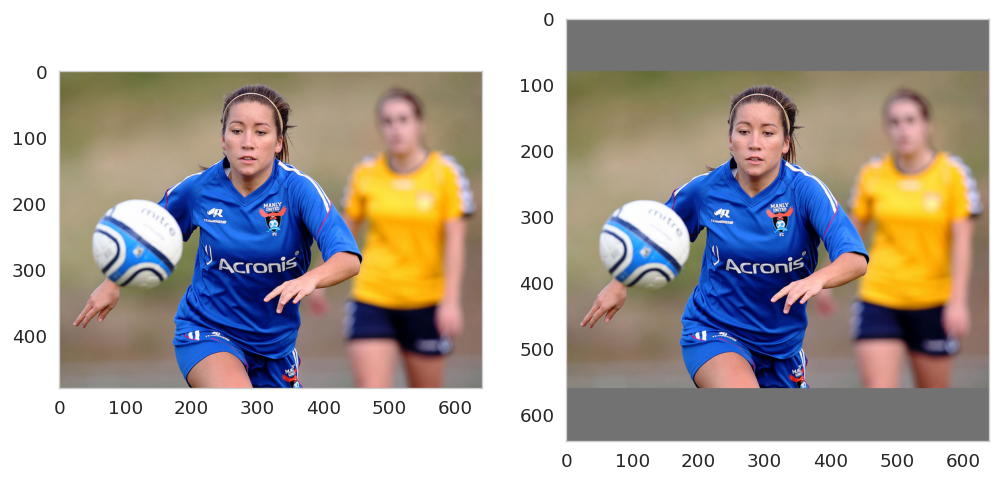

In [3]:
image_files = os.listdir("coco-pictures")
test_img_name = random.choice(image_files)
# test_img_name = "bus.jpg"
test_img = cv2.imread(osp.join("coco-pictures", test_img_name))
test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
letterbox_img, ratio, dw_dh = letterbox(test_img, auto=False)
print(ratio, dw_dh)
plot_multi_images(test_img, letterbox_img)

torch.Size([1, 3, 640, 640])


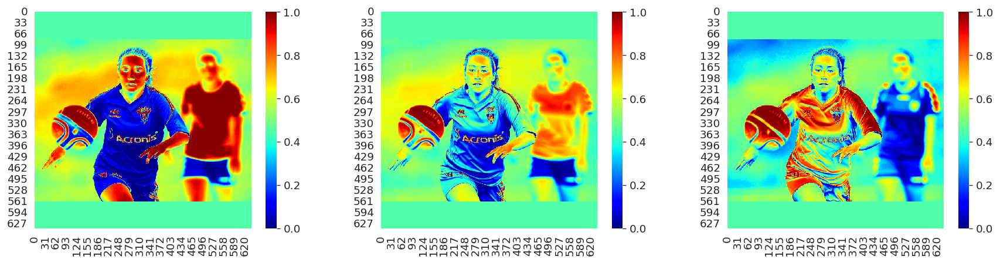

In [4]:
tf = transforms.ToTensor()

tensor_input = tf(letterbox_img).unsqueeze(0).to(device)
print(tensor_input.shape)
plot_multi_heatmaps(*tensor_input[0])

In [5]:
tensor_output = model(tensor_input)
print(tensor_output[0].shape)
print(*(j.shape for i in tensor_output[1] for j in i), sep="\n")

torch.Size([1, 84, 8400])
torch.Size([1, 144, 80, 80])
torch.Size([1, 144, 40, 40])
torch.Size([1, 144, 20, 20])
torch.Size([64, 8400])
torch.Size([80, 8400])


In [6]:
pred = tensor_output[0].detach().contiguous()
head_shapes = [80, 40, 20]
heads = []
start_i = 0
for i, p in enumerate(head_shapes):
    heads.append(pred[..., start_i:start_i + p ** 2].reshape(len(model.names) + 4, p, p))
    start_i += p ** 2
print(*[i.shape for i in heads], sep="\n")

torch.Size([84, 80, 80])
torch.Size([84, 40, 40])
torch.Size([84, 20, 20])


In [7]:
nms_pred = non_max_suppression(pred)[0].cpu().numpy()
print(nms_pred)

[[     21.928      101.47      460.32      554.59     0.96917           0]
 [     49.533      274.77      188.52      413.75      0.9531          32]
 [     424.34      107.41      632.48      553.55     0.94784           0]]


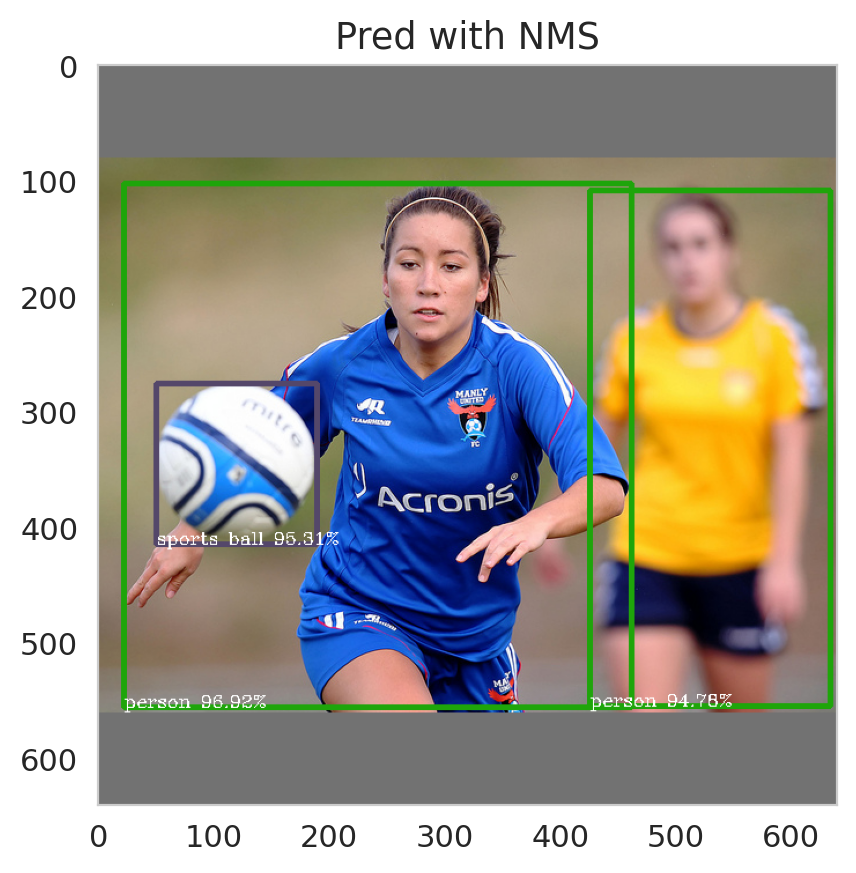

In [8]:
input_img = letterbox_img.copy()
for *xyxy, conf, cls in nms_pred:
    xyxy = np.ceil(xyxy).astype(np.uint32)
    cls = int(cls + 0.5)
    cv2.rectangle(input_img, xyxy[:2], xyxy[2:], color[cls + 5], thickness=3)
    cv2.putText(input_img, f"{model.names[cls]} {100 * conf:.2f}%", xyxy[[0, 3]], color=(255, 255, 255),
                fontFace=cv2.FONT_HERSHEY_COMPLEX, fontScale=0.5)

plot_single_image(input_img, title="Pred with NMS")

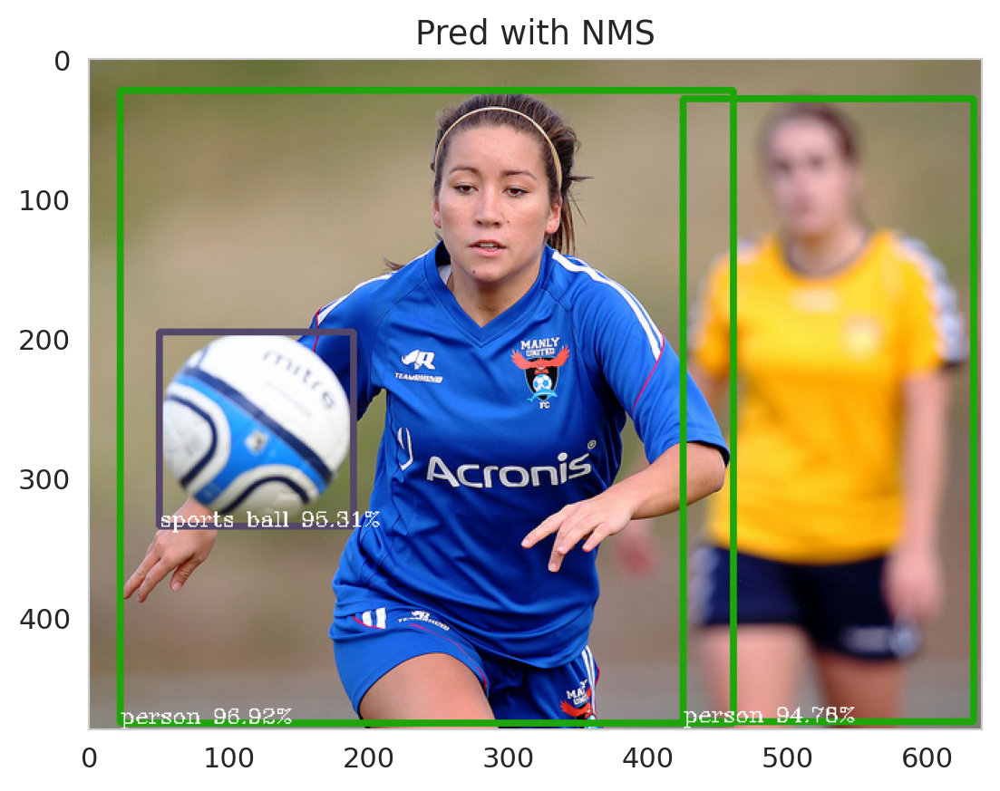

In [9]:
boxes0 = scale_boxes(letterbox_img.shape,
                     nms_pred,
                     test_img.shape,
                     (ratio, dw_dh))
input_img = test_img.copy()
for *xyxy, conf, cls in boxes0:
    xyxy = np.ceil(xyxy).astype(np.uint32)
    cls = int(cls + 0.5)
    cv2.rectangle(input_img, xyxy[:2], xyxy[2:], color[cls + 5], thickness=3)
    cv2.putText(input_img, f"{model.names[cls]} {100 * conf:.2f}%", xyxy[[0, 3]], color=(255, 255, 255),
                fontFace=cv2.FONT_HERSHEY_COMPLEX, fontScale=0.5)

plot_single_image(input_img, title="Pred with NMS")

00: person
32: sports ball


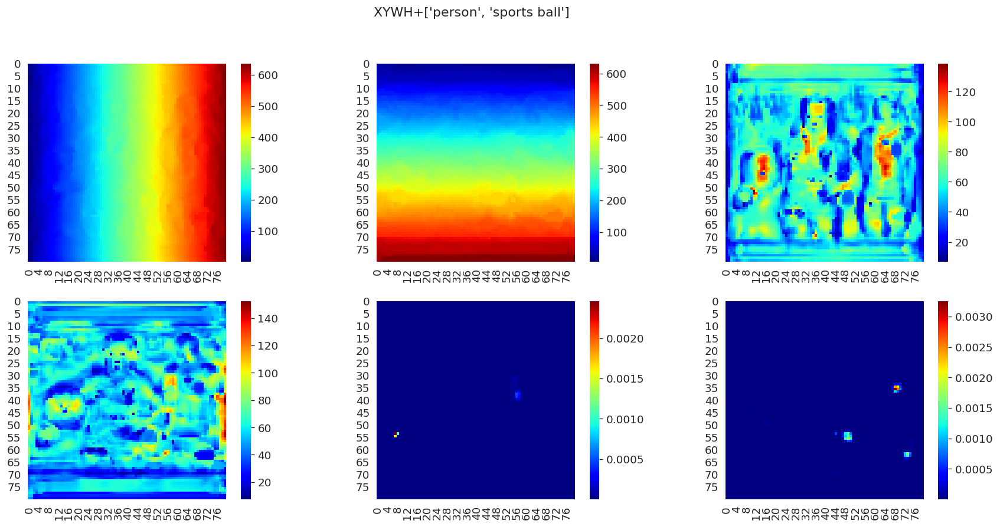

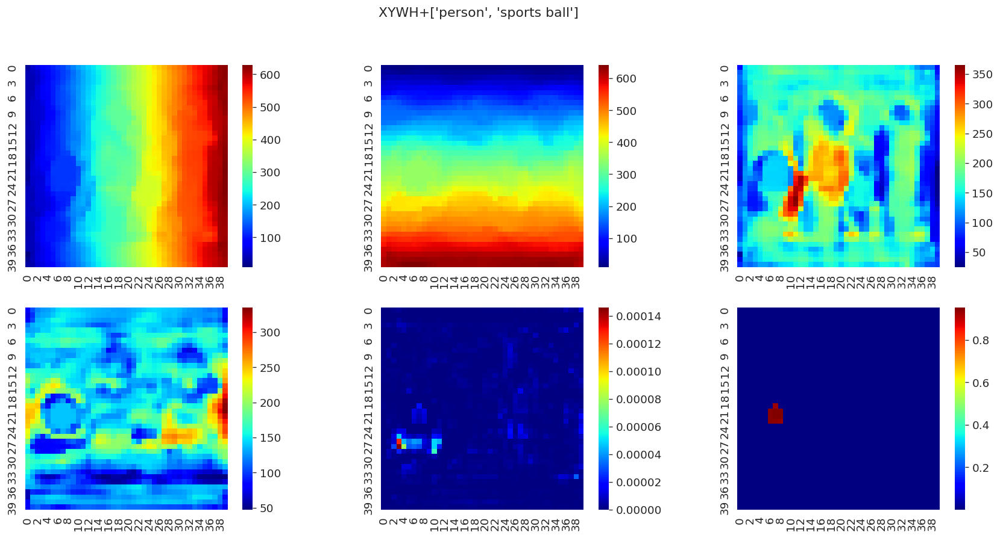

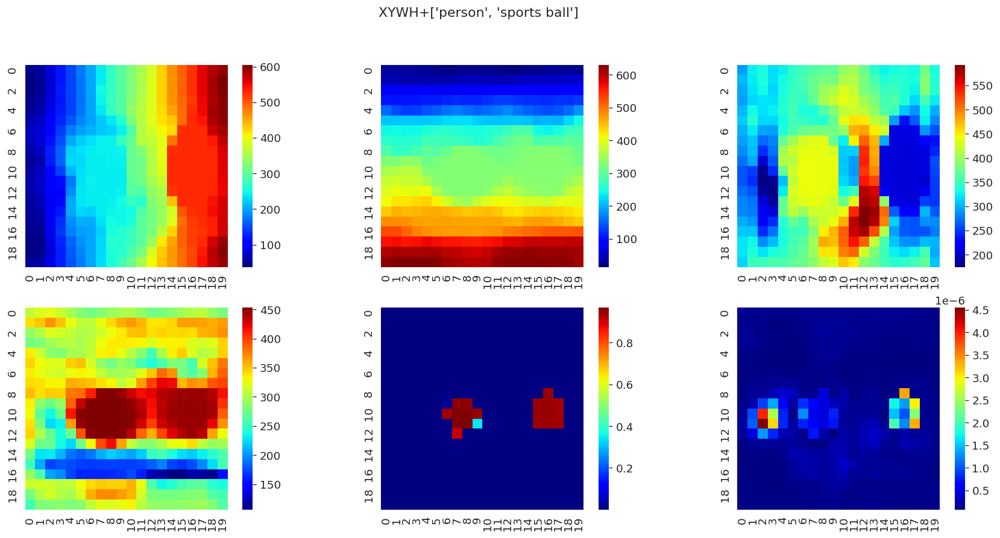

In [10]:
decoupled_classes = list(set(nms_pred.T[-1].astype(np.uint32).tolist()))  #XYWH+Classes
decoupled_classes.sort()
for i in decoupled_classes:
    print(f"{i:02d}: {model.names[i]}")
decoupled_indexes = [0, 1, 2, 3, ] + list(set((4 + nms_pred).T[-1].astype(np.uint32).tolist()))  #XYWH+Classes
decoupled_indexes.sort()
for head in heads:
    plot_multi_heatmaps(*head[decoupled_indexes, ...], title=f"XYWH+{[model.names[i] for i in decoupled_classes]}")

In [11]:
conf_filter_heads = []
for head in heads:
    cls, y, x = torch.where(head[4:].cpu() >= 0.25)
    conf_filter_heads.append(np.array([cls.numpy(), y.numpy(), x.numpy()]))
conf_filter_heads

[array([], shape=(3, 0), dtype=int64),
 array([[32, 32, 32, 32, 32, 32, 32, 32, 32, 32],
        [19, 20, 20, 20, 21, 21, 21, 22, 22, 22],
        [ 7,  6,  7,  8,  6,  7,  8,  6,  7,  8]]),
 array([[ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
        [ 8,  9,  9,  9,  9,  9, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 12],
        [16,  7,  8, 15, 16, 17,  6,  7,  8,  9, 15, 16, 17,  7,  8,  9, 15, 16, 17,  7]])]

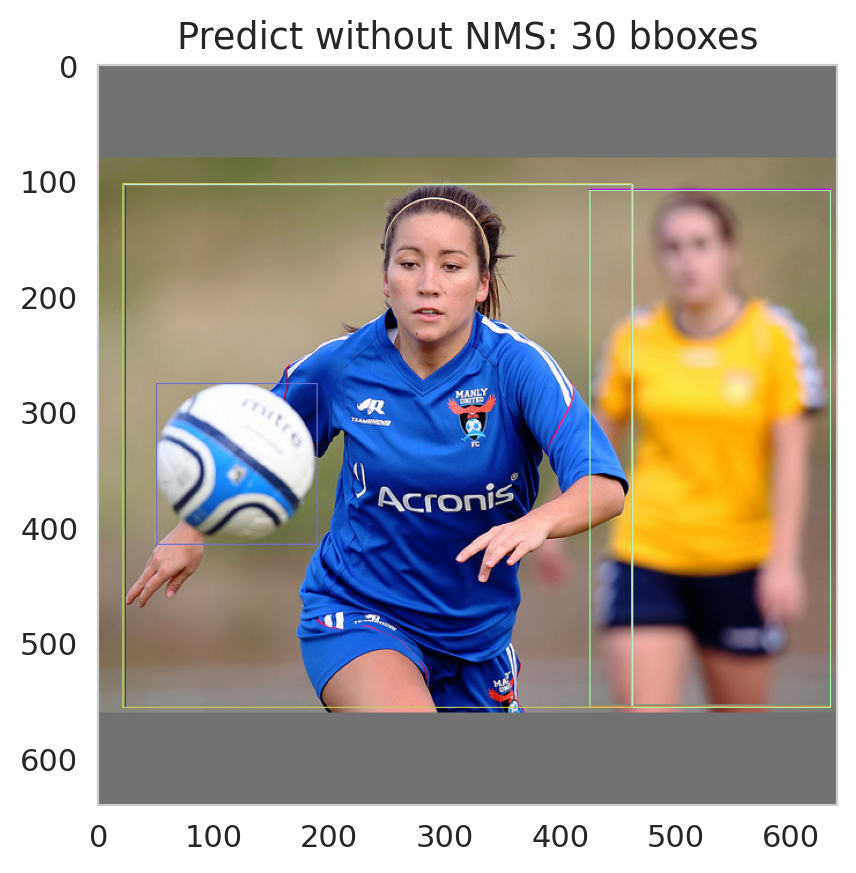

In [12]:
input_img = letterbox_img.copy()
for i, fiter_head in enumerate(conf_filter_heads):
    for cls, y, x in fiter_head.T:
        xywh = heads[i][:4, y, x].cpu().numpy()
        xy1 = np.ceil(xywh[:2] - xywh[2:] / 2).astype(np.uint32)
        xy2 = np.ceil(xywh[:2] + xywh[2:] / 2).astype(np.uint32)
        conf = heads[i][cls, y, x]
        cv2.rectangle(input_img, xy1, xy2, tuple(random.randint(0, 255) for _ in range(3)), thickness=1)
        # cv2.putText(input_img, f"{model.names[cls]} {100 * conf:.2f}%", (xy1[0], xy2[1]), color=(0, 127, 255), fontFace=cv2.FONT_HERSHEY_COMPLEX, fontScale=0.5)

plot_single_image(input_img,
                  title=f"Predict without NMS: {sum(i.shape[1] for i in conf_filter_heads)} bboxes")

# 我们只提取并查看几个关键地方的特征图，即模型结构中一个完整功能结构的末尾。

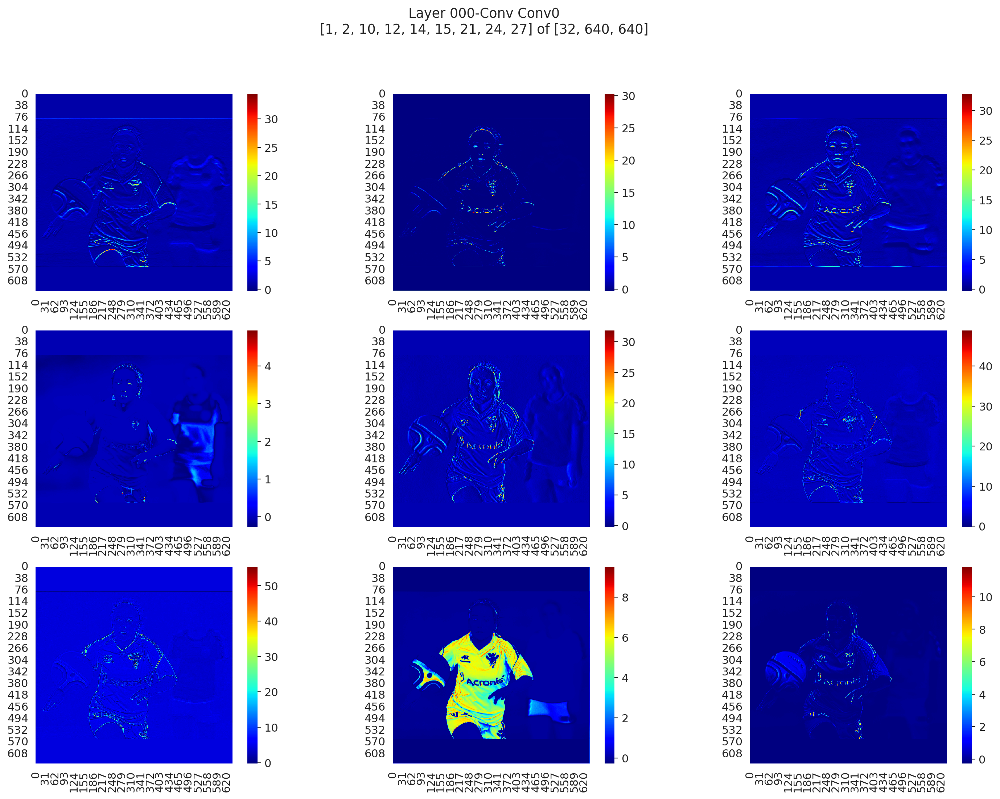

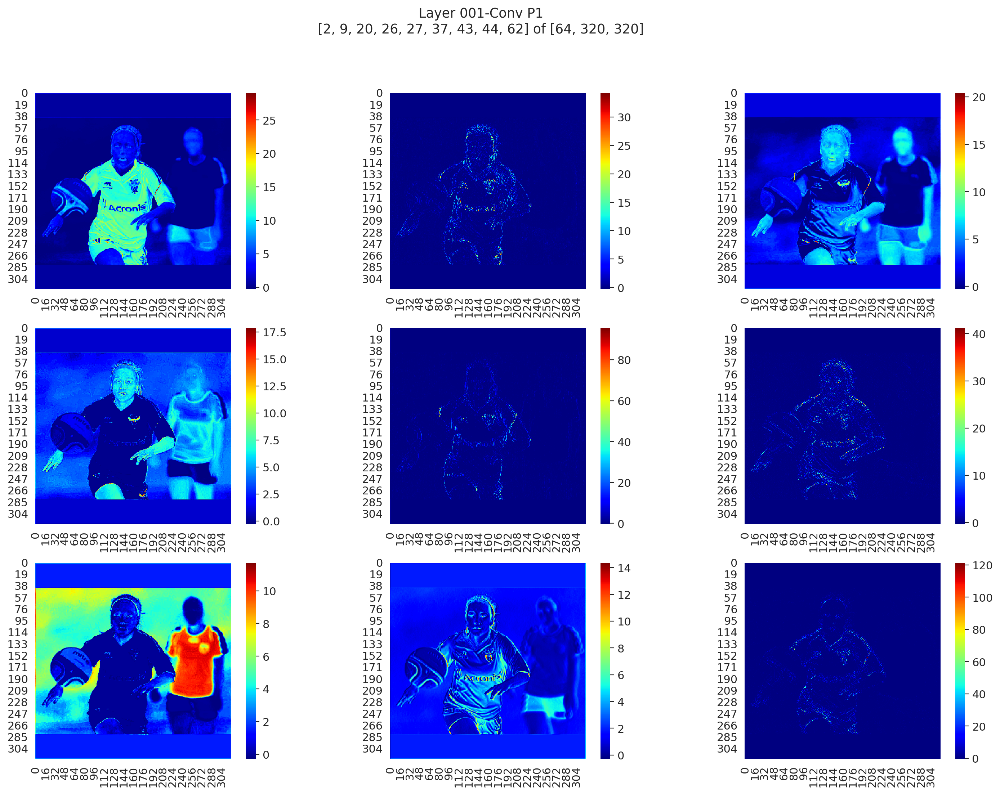

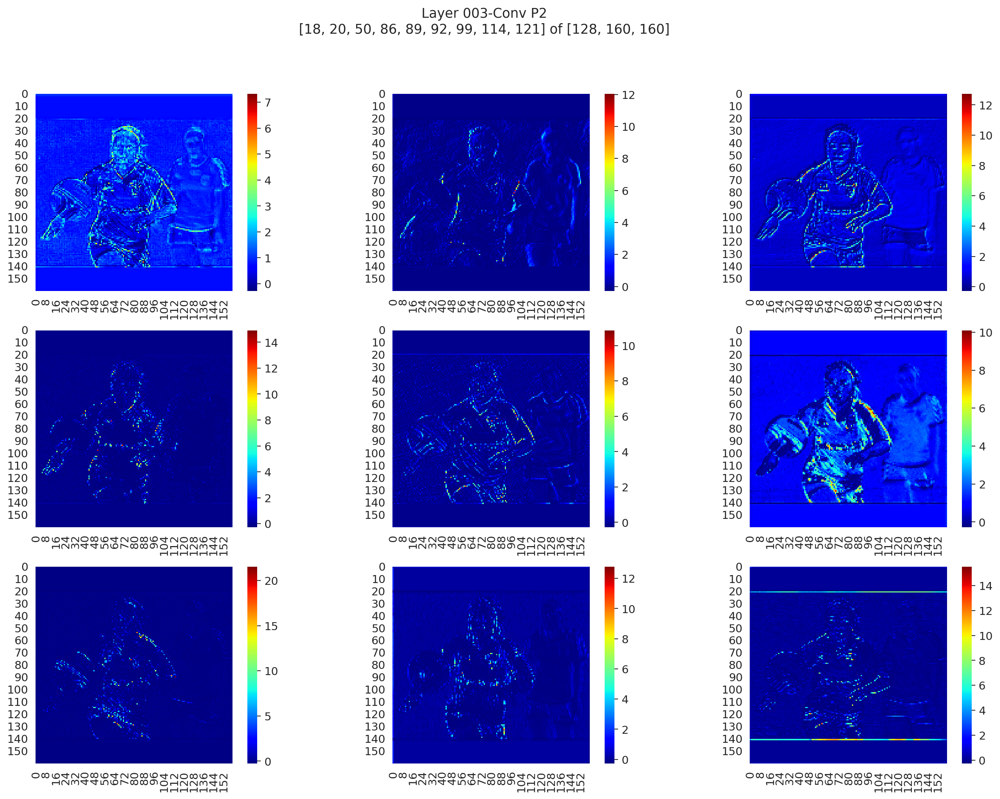

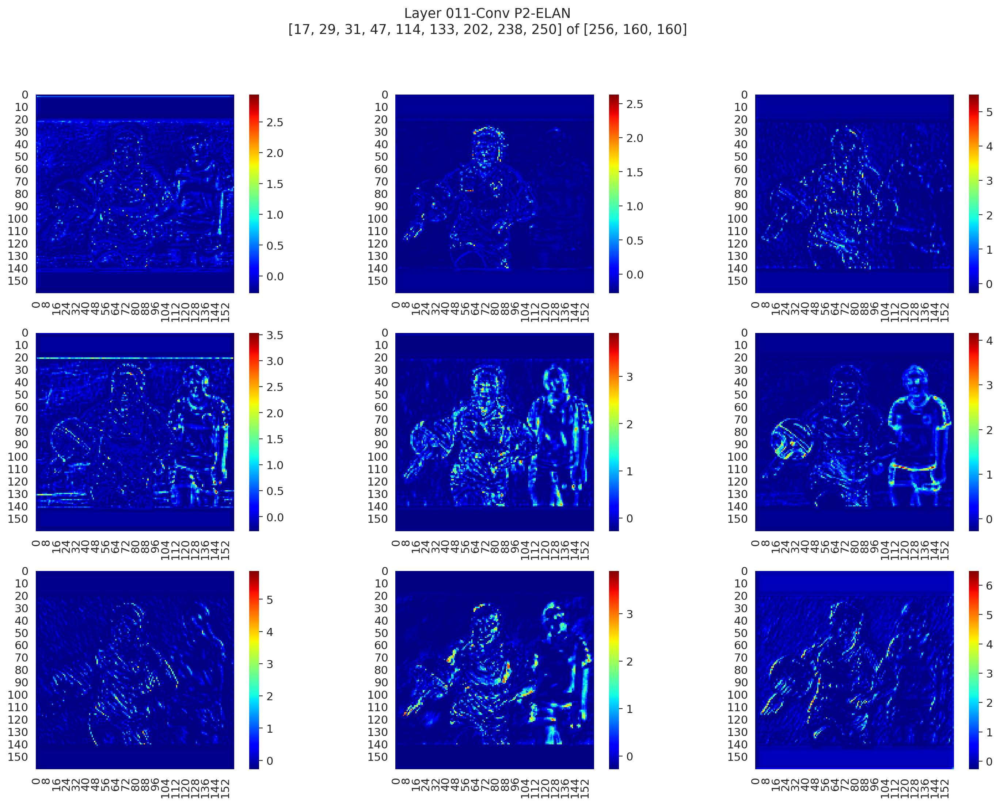

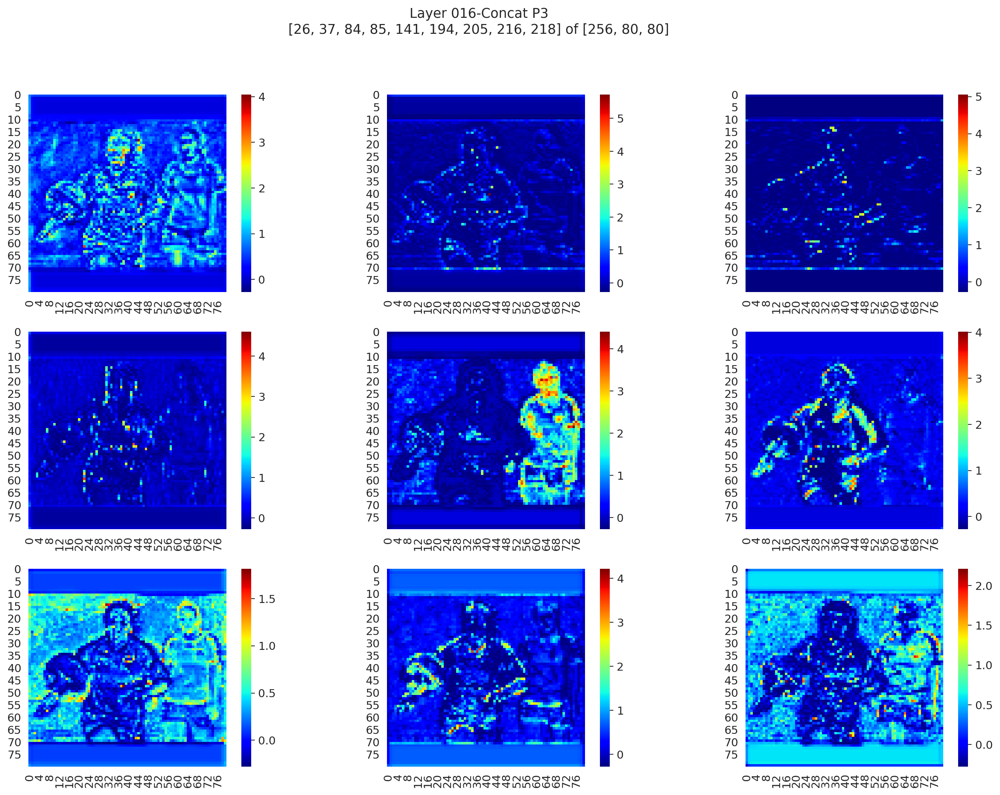

...

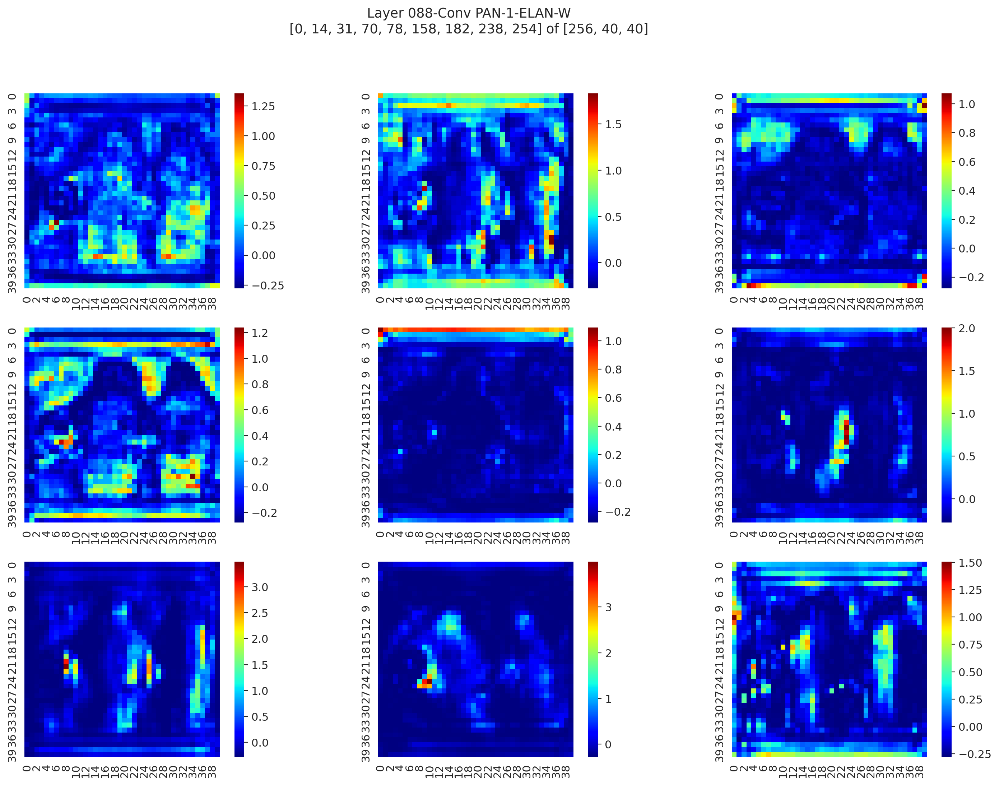

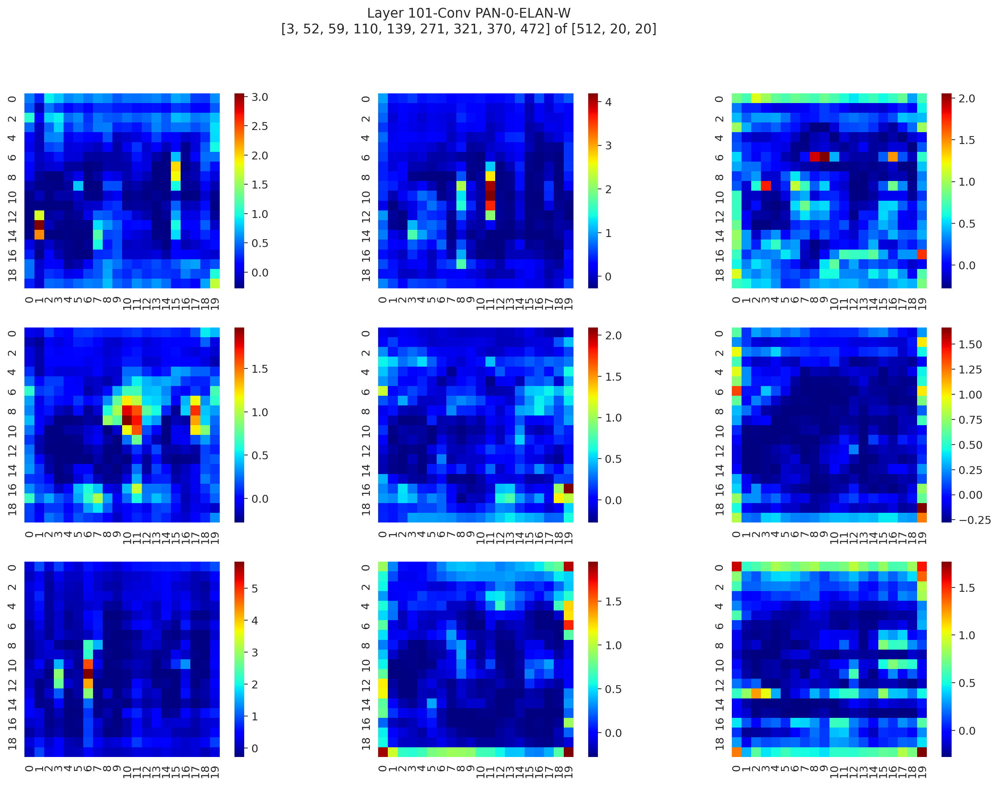

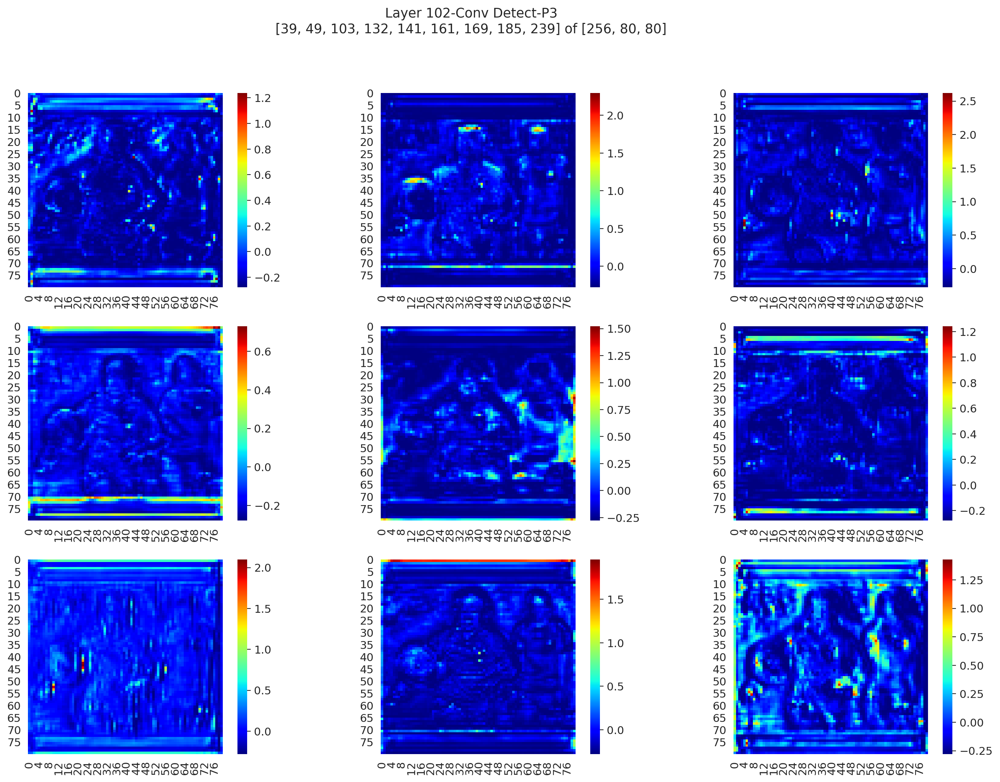

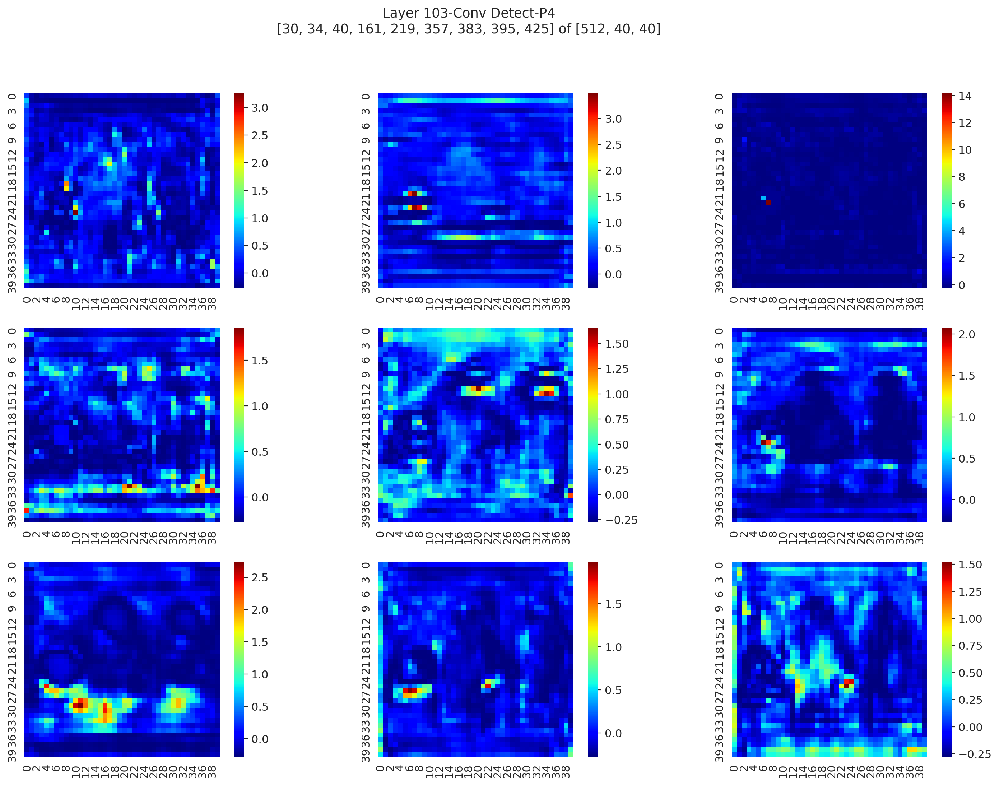

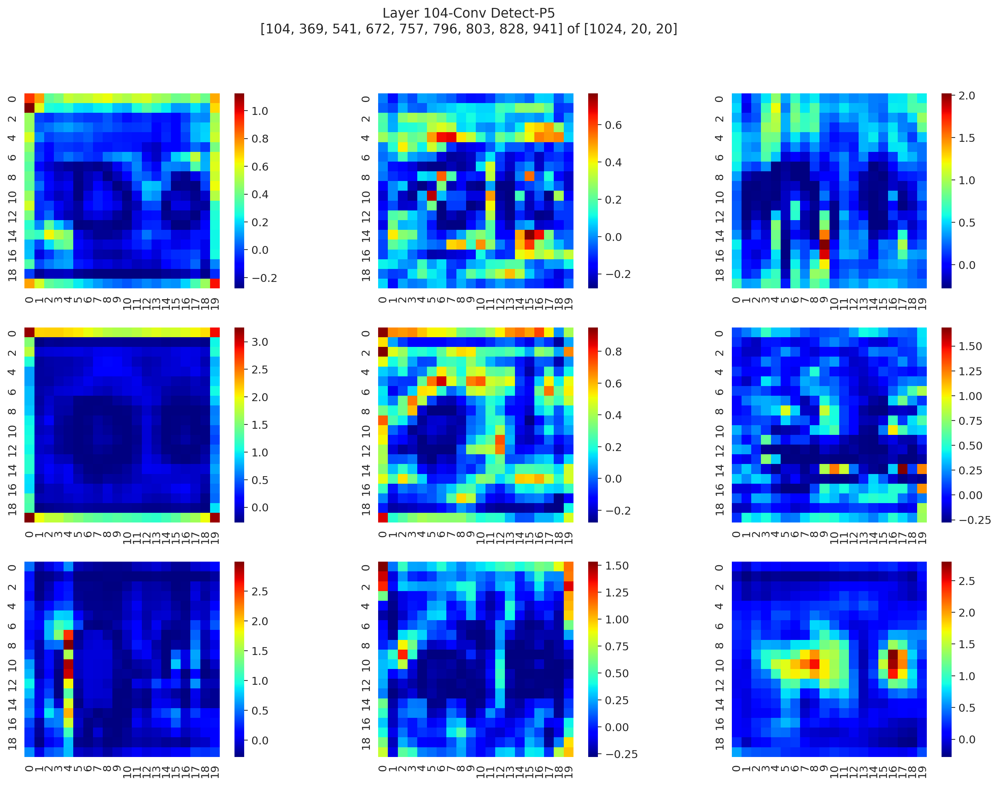

In [13]:
os.makedirs(f"./features/{test_img_name}", exist_ok=True)

# 0 P1 P2 11 P3 24 P4 37 P5 50 SPPCSPC FPN1 FPN2 PAN2 PAN1 Det1 Det2 Det3
# vis_layer = [0, 1, 3, 11, 16, 24, 29, 37, 42, 50, 51, 63, 75, 88, 101, 102, 103, 104]
vis_layer = {
    "0": "Conv0",
    "1": "P1",
    "3": "P2",
    "11": "P2-ELAN",
    "16": "P3",
    "24": "P3-ELAN(to FPN2)",
    "29": "P4",
    "37": "P4-ELAN(to FPN1)",
    "42": "P5",
    "50": "P5-ELAN4(to SPPCSPC)",
    "51": "SPPCSPC",
    "63": "FPN-1-ELAN-W",
    "75": "FPN-2-ELAN-W (PAN-2)",
    "88": "PAN-1-ELAN-W",
    "101": "PAN-0-ELAN-W",
    "102": "Detect-P3",
    "103": "Detect-P4",
    "104": "Detect-P5",
}

for i, block in enumerate(model.model):
    if hasattr(block, "features") and str(i) in vis_layer:
        module_name = block._get_name()
        output_dir = f"./features/{test_img_name}/{i:03d}-{module_name}"

        feature_maps = block.features[0].cpu().numpy()
        length = feature_maps.shape[0]
        chosen = list(sorted(random.sample(range(length), min(9, length))))
        plot_multi_heatmaps(*feature_maps[chosen],
                            title=f"Layer {i:03d}-{module_name} {vis_layer[str(i)]}\n"
                                  f"{chosen} of {list(feature_maps.shape)}",
                            dpi=100)
        plt.show()
        plt.close()
        # 全部画出来很慢很慢
        # os.makedirs(output_dir, exist_ok=True)
        # for j, feature_map in enumerate(block.features[0].cpu().numpy()):
        #     plot_single_heatmap(feature_map, dpi=300)
        #     plt.savefig(osp.join(output_dir, f"{j:03d}.png"))
        #     plt.close()